# 2018/2019 - Task List 1

1. Generate random variable from prefered dystribution using Pyro (pyro.sample)
    
    - animate how distribution of values changes
    - animate histograms of values
    - start with empty list of values, generate new samples, generate histogram
    
    
2. Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.

    - it must be a simulator!
    - sample from distribution using given probabilities
    - repeate experiment and compare with Bayes equation


## Required imports

In [1]:
%matplotlib inline
import pyro
import torch
import numpy as np
import matplotlib.pyplot as plt

from matplotlib import animation, rc
from IPython.display import HTML

## Generating single value from normal distribution with given mean and variance

In [2]:
mean = 0
variance = 10
x = pyro.sample("normal_sampling", pyro.distributions.Normal(mean, variance))
print(x)

tensor(5.5949)


## Sampling from categorical probabilities with given probabilities

In [3]:
x = pyro.sample("categorical_sampling", pyro.distributions.Categorical(logits = torch.tensor([0.5, 0.5])))
print(x)

tensor(1)


## Animating data

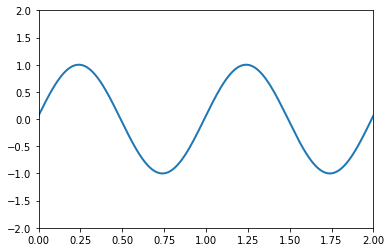

In [4]:
def animate():
    # First set up the figure, the axis, and the plot element we want to animate
    fig, ax = plt.subplots()

    ax.set_xlim(( 0, 2))
    ax.set_ylim((-2, 2))

    line, = ax.plot([], [], lw=2)
    
    # animation function. This is called sequentially
    def sin(i):
        x = np.linspace(0, 2, 1000)
        y = np.sin(2 * np.pi * (x - 0.01 * i))
        line.set_data(x, y)
        return (line,)

    # initialization function: plot the background of each frame
    def init():
        line.set_data([], [])
        return (line,)
    # call the animator. blit=True means only re-draw the parts that have changed.
    anim = animation.FuncAnimation(fig, sin, init_func=init,
                                   frames=100, interval=20, blit=True)
    return HTML(anim.to_jshtml())

animate()

## Drawing histogram

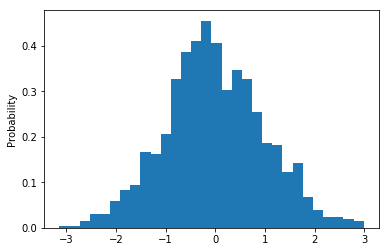

In [5]:
x = np.random.normal(size = 1000)
plt.hist(x, density=True, bins=30)
plt.ylabel('Probability');

## Task 1

Generate random variable from prefered dystribution using Pyro (pyro.sample)
    - animate how distribution of values changes
    - animate histograms of values
    - start with empty list of values, generate new samples, generate histogram


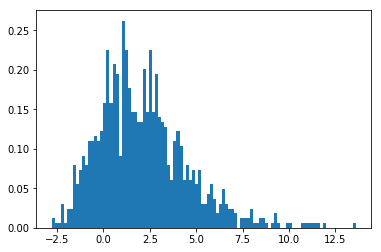

In [6]:
samples = []
iterations = 100
location = 1
scale = 2

for i in range(iterations):
    samples.append(pyro.sample("gumbel_sampling", pyro.distributions.Gumbel(location, scale)))
    
x = np.random.gumbel(location, scale, 1000)
plt.hist(x, density=True, bins=100)
plt.draw()


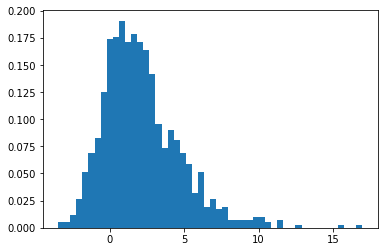

In [7]:
import itertools

def animate():
    values = []
    
    def add_sample():
        location = 1
        scale = 2
        values.append(pyro.sample("gumbel_sampling", pyro.distributions.Gumbel(location, scale)))
        
    
    def draw_histogram(_):
        plt.cla()
        add_sample()
        plt.hist(values, density=True, bins=50)
    
    anim = animation.FuncAnimation(plt.figure(), draw_histogram, 
                                   init_func=lambda *args: None, #do nothing
                                   repeat=False, frames=1000, interval=100)
    return HTML(anim.to_jshtml())

animate()

## Task 2

Write a simulator (and exact solution utilizing Bayes theorem) for chances to be ill on a certain disease. We know that it affects from about 1 to 100 out of 50,000 people. There was developed a test to check whether the person has the disease and it is quite accurate: the probability that the test result is positive (suggesting the person has the disease), given that the person does not have the disease, is only 2 percent; the probability that the test result is negative (suggesting the person does not have the disease), given that the person has the disease, is only 1 percent. When a random person gets tested for the disease and the result comes back positive, what is the probability that the person has the disease? Check whole parameter space and visualise results.

    - it must be a simulator!
    - sample from distribution using given probabilities
    - repeate experiment and compare with Bayes equation

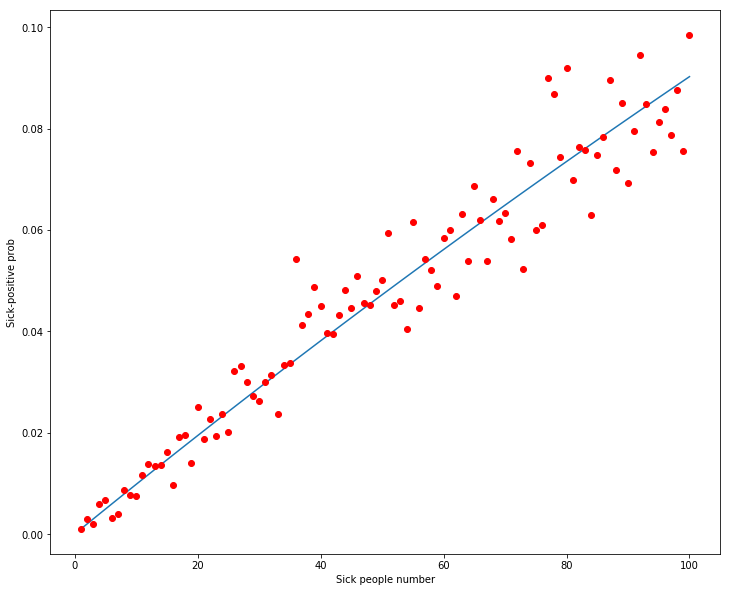

In [13]:
from random import randint

population_size = 50000
min_sick = 1
max_sick = 100

positive_healthy_prob = 0.02
negative_healthy_prob = 1 - positive_healthy_prob
negative_sick_prob = 0.01
positive_sick_prob = 1 - negative_sick_prob


def get_categorical_sample(prob, sample_size):
    with pyro.plate("sample_size", sample_size):
        return torch.sum(
            pyro.sample("categorical_sampling", pyro.distributions.Categorical(probs = torch.tensor([1 - prob, prob])))
        )

def get_categorical_sample(p, size):
        with pyro.plate("size", size):
            return torch.sum(pyro.sample("categorical_sampling", pyro.distributions.Categorical(probs = torch.tensor([1-p, p]))))

def simulate_population(sick_people_number):
    sick_prob = sick_people_number/population_size 

    sick_population = get_categorical_sample(sick_prob, population_size)
    healthy_population = population_size - sick_population
    
    positive_sick_population = get_categorical_sample(positive_sick_prob, sick_population)
    positive_healthy_population = get_categorical_sample(positive_healthy_prob, healthy_population)
    positive_population = positive_sick_population + positive_healthy_population
    
    return positive_sick_population.item() / positive_population.item()


def count_bayes_prob(sick_people_number):
    sick_prob = sick_people_number / population_size
    healthy_prob = 1 - sick_prob
    positive_prob = positive_sick_prob * sick_prob + positive_healthy_prob * healthy_prob
    
    #P(sick|positive) = P(positive|sick) * P(sick) / P(positive)
    sick_positive_prob = positive_sick_prob * sick_prob / positive_prob
    return sick_positive_prob

def draw(sick_people, simulate_result, bayes_result):
    fig, ax = plt.subplots(figsize=(12, 10))
    ax.plot(sick_people, bayes_result)
    ax.plot(sick_people, simulate_result, 'or')
    plt.xlabel('Sick people number')
    plt.ylabel('Sick-positive prob')
    

sick_people = [x for x in range(1, 101)]
simulation_result = [simulate_population(n) for n in sick_people]
bayes_result = [count_bayes_prob(n) for n in sick_people]
draw(sick_people, simulation_result, bayes_result)